## Camera Calibration

In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
import matplotlib.patches as patches
from matplotlib.path import Path
from scipy import signal
import peakutils

## Calibrate the Camera

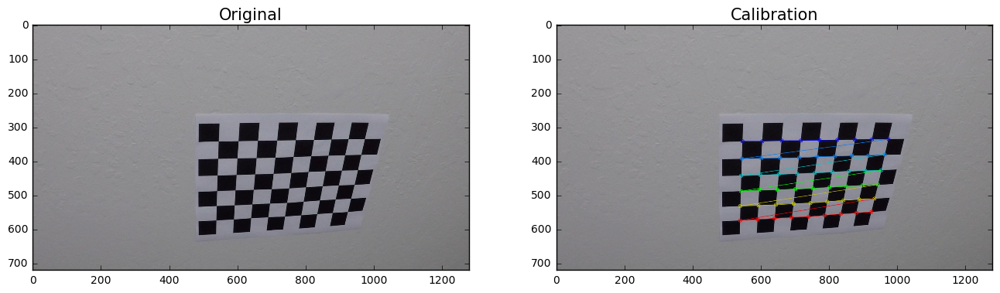

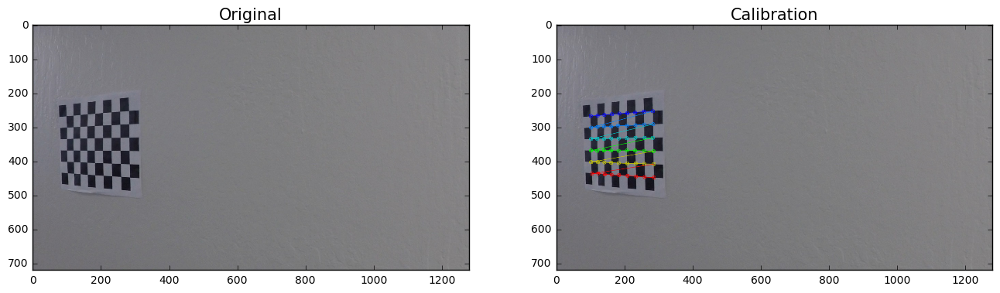

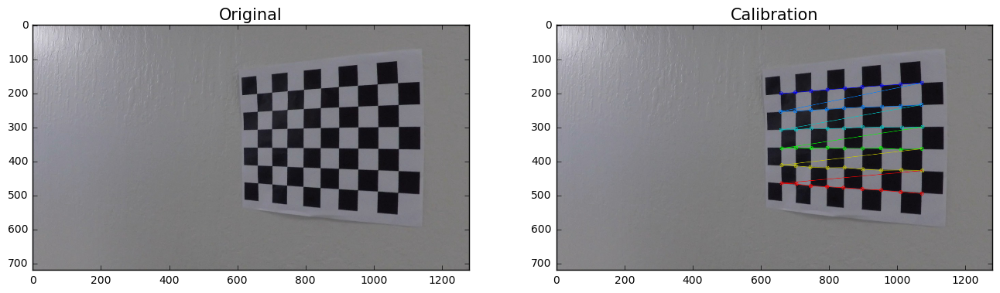

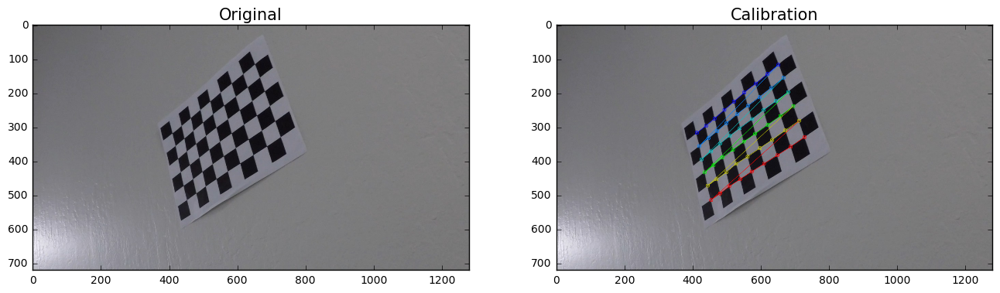

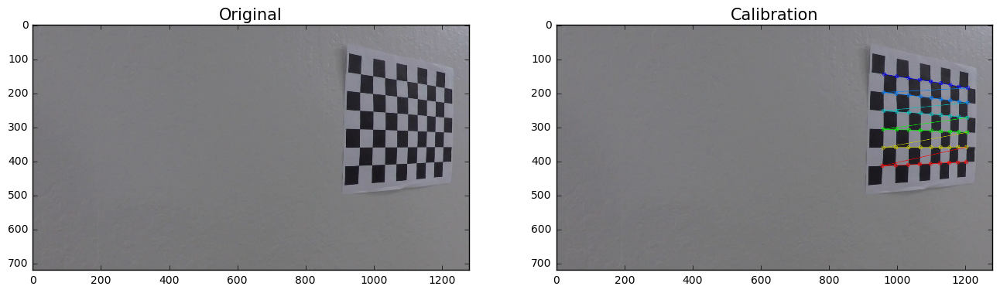

...

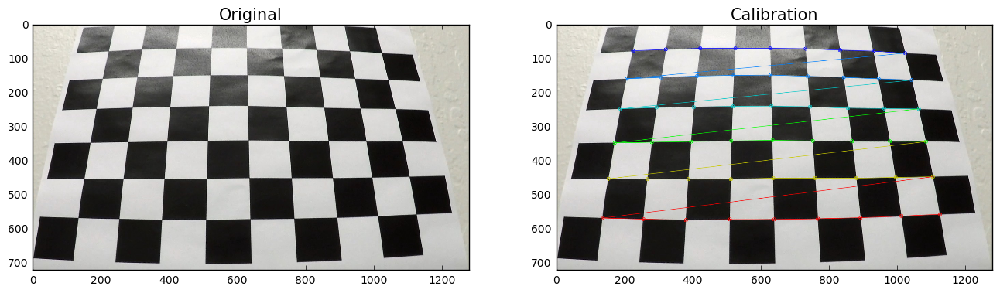

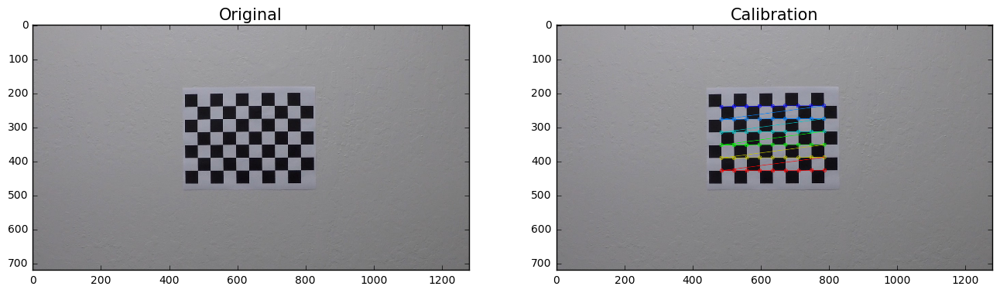

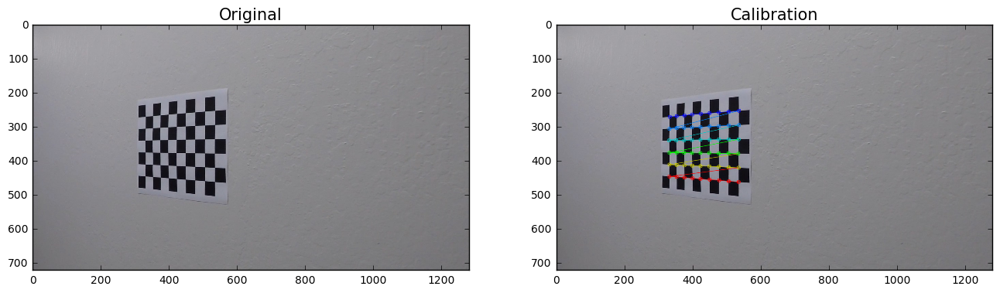

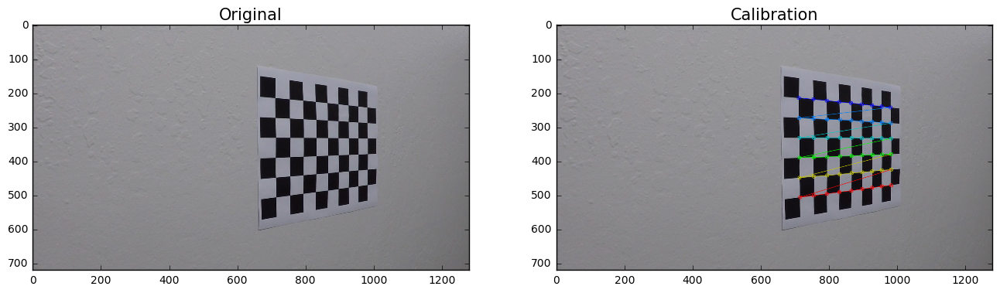

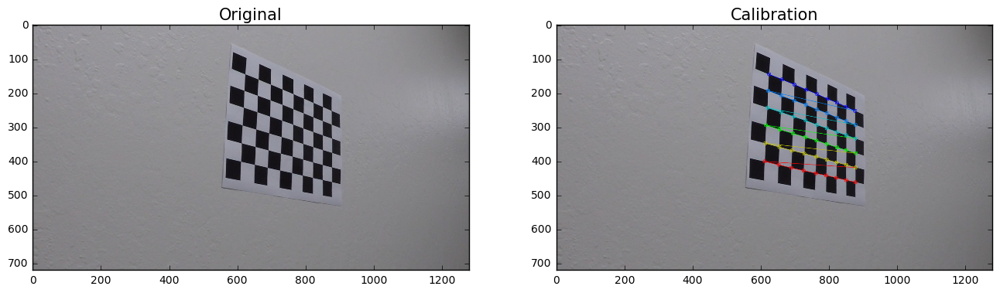

In [3]:
cal_images = glob.glob("calibration/calibration*.jpg")
objpoints = []
imgpoints = []
nx = 9
ny = 6
    
objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
for calibrate in cal_images:
    img = mpimg.imread(calibrate)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny) ,None)
        
    if ret == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
        ax1.set_title('Original', fontsize=15)
        ax1.imshow(img)
        imgpoints.append(corners)
        objpoints.append(objp)
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        ax2.set_title('Calibration', fontsize=15)
        ax2.imshow(img)
        plt.show()

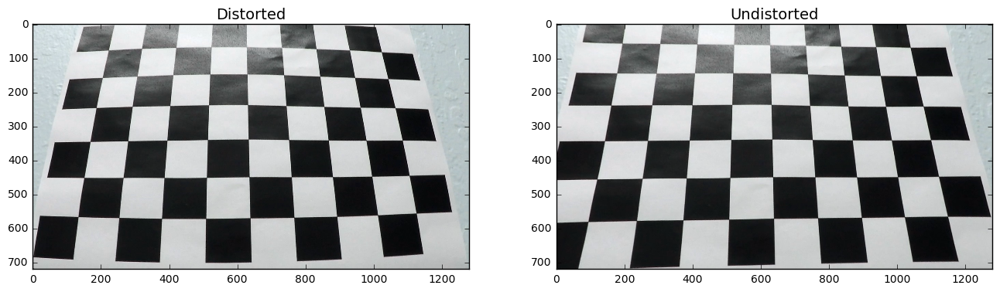

In [8]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

img = cv2.imread("calibration/calibration3.jpg")
dst = undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
ax1.set_title("Distorted",fontsize=14)
ax1.imshow(img)
ax2.set_title("Undistorted",fontsize=14)
ax2.imshow(dst)
plt.show()

In [9]:
# Save to pickle file
import pickle as pickle

save_pickle = {}
save_pickle = [mtx, dist]
pickle.dump(save_pickle, open( "calibration.pkl", "wb" ))

## Helper Function for Thresholding

In [15]:
def abs_sobel_thresh(img, orient='x', ksize=3, thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    retval, gbinary = cv2.threshold(scaled_sobel, thresh[0], thresh[1], cv2.THRESH_BINARY)
    return gbinary


def mag_thresh(img, ksize=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag) / 255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_thresh(img, sobel_kernel=3, dir_thresh=(0, np.pi / 2)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    graddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(graddir)
    binary_output[(graddir >= dir_thresh[0]) & (graddir <= dir_thresh[1])] = 1
    return binary_output

def hls_threshold(img, hls_thresh=(0,255)):
    #Take the S Channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #H = hls[:,:,0]
    #L = hls[:,:,1]
    S = hls[:,:,2]
    hls_binary = np.zeros_like(S)
    hls_binary[(S >= hls_thresh[0]) & (S <= hls_thresh[1])] = 1
    return hls_binary

def hls_select(img, channel="s", thresh=(0,255)):
    img = np.copy(img)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if channel == 'h':
        C = hls[:,:,0]
    elif channel == 'l':
        C = hls[:,:,1]
    else :
        C = hls[:,:,2]
    retval, binary_output = cv2.threshold(C.astype('uint8'), thresh[0], thresh[1], cv2.THRESH_BINARY)
    return binary_output

def hsv_select(img, mask='y', thresh_y=(0,255),thresh_w=(0,255) ): 
    img = np.copy(img)
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if (mask == 'yw') | (mask == 'y'):
        hsv_ty = cv2.inRange(hsv_img, Y_thresh[0], Y_thresh[1])
    else:
        hsv_ty = np.zeros((img.shape[0],img.shape[1]))
    if (mask == 'yw') | (mask == 'w'):
        hsv_tw = cv2.inRange(hsv_img, W_thresh[0], W_thresh[1])
    else:
        hsv_tw = np.zeros((img.shape[0],img.shape[1]))
    
    binary_output = np.zeros_like(hsv_tw)
    binary_output[(hsv_ty > 0) | (hsv_tw > 0)] = 230 
    return hsv_ty,hsv_tw,binary_output

def rgb_select(img, channel="r", thresh=(0,255)): 
    img = np.copy(img)
    if channel == 'r':
        C = img[:,:,0]
    elif channel == 'g':
        C = img[:,:,1]
    else :
        C = img[:,:,2]
    retval, binary_output = cv2.threshold(C.astype('uint8'), thresh[0], thresh[1], cv2.THRESH_BINARY)
    return binary_output

def roi(img, verts):
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, [verts], 255)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


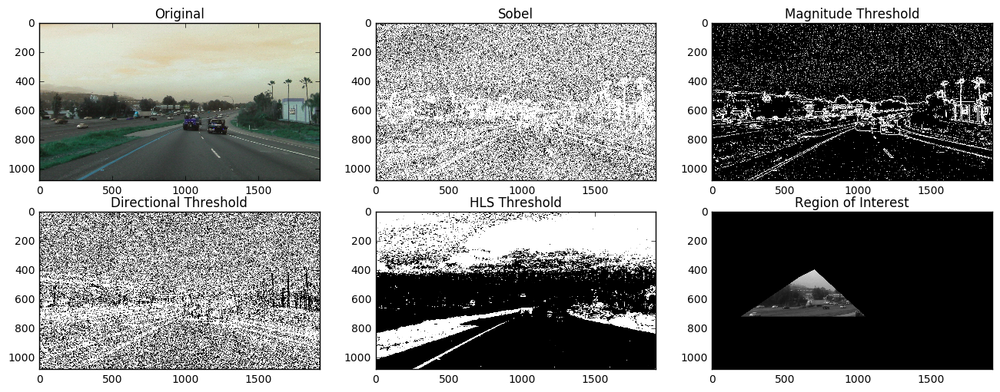

In [19]:
img = mpimg.imread("test_images/test_1.jpg")
convert = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
vertices = np.int32([(200, 720), (600, 450), (700, 400), (1050, 720)])
sobel = abs_sobel_thresh(img, orient='x')
mag_thres = mag_thresh(img, mag_thresh=(10, 100))
dir_thres = dir_thresh (img, sobel_kernel = 5, dir_thresh=(0.7, 2.5))
hls_thres = hls_threshold(img, hls_thresh=(50, 150))
region_of_interest = roi(convert , vertices)

plt.show()
plt.figure(figsize=[16, 9])
plt.subplot(3, 3, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(3, 3, 2)
plt.title('Sobel')
plt.imshow(sobel, cmap='gray')
plt.subplot(3, 3, 3)
plt.title('Magnitude Threshold')
plt.imshow(mag_thres, cmap='gray')
plt.subplot(3, 3, 4)
plt.title('Directional Threshold')
plt.imshow(dir_thres, cmap='gray')
plt.subplot(3, 3, 5)
plt.title('HLS Threshold')
plt.imshow(hls_thres, cmap='gray')
plt.subplot(3, 3, 6)
plt.title('Region of Interest')
plt.imshow(region_of_interest, cmap='gray')



## Perspective Transform

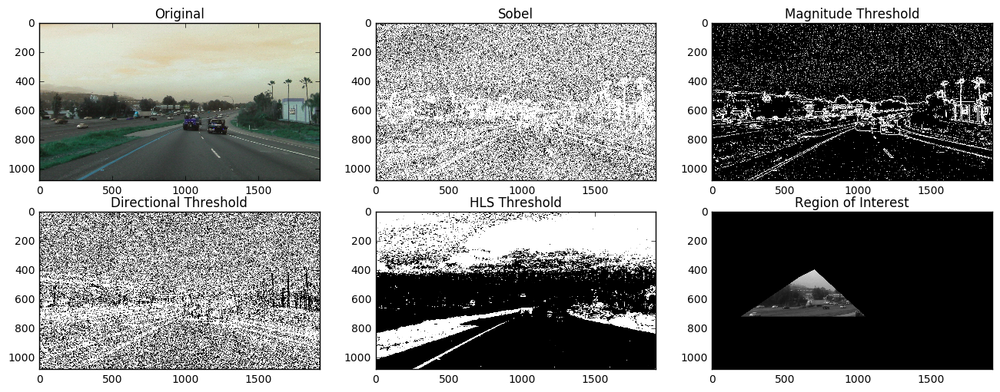

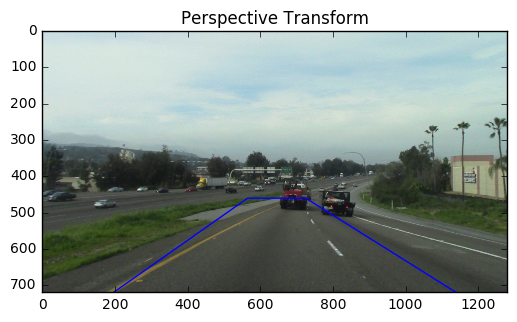

In [20]:
# Load an image with a straight road.
img = mpimg.imread("test_images/test_1.jpg")
img = cv2.resize(img, (1280, 720))
img = undistort(img)

def perspective_transform(img) :
    img_shape = (img.shape[1],img.shape[0])
    if img_shape == (1280, 720):
        src = get_src(img)
        dst = get_dst(img)
        
    M = cv2.getPerspectiveTransform(np.float32(get_src(img)), np.float32(get_dst(img)))
    Minv = cv2.getPerspectiveTransform(np.float32(get_dst(img)), np.float32(get_src(img)))
    warped = cv2.warpPerspective(img,M,img_shape,flags=cv2.INTER_LINEAR)
    return warped,Minv

def get_src_pts(img):
    top_left = (565, 460)
    top_right = (725, 460)
    bottom_left = (195, 720)
    bottom_right = (1140, 720)
    return (bottom_left, top_left, top_right, bottom_right)

def get_dst_pts(img):
    width = img.shape[1]
    height = img.shape[0]
    top_left = (width*0.1, 0)
    top_right = (width*0.9, 0)
    bottom_left = (width*0.1, height)
    bottom_right = (width*.9, height)
    return (bottom_left, top_left, top_right, bottom_right)
    

path = Path(get_src_pts(img), (Path.MOVETO, Path.LINETO, Path.LINETO, Path.LINETO))
patch = patches.PathPatch(path, facecolor="none", edgecolor="blue", lw=1.0)

fig, ax = plt.subplots(1)
ax.set_title("Perspective Transform")
ax.imshow(img)
ax.add_patch(patch)
plt.show()

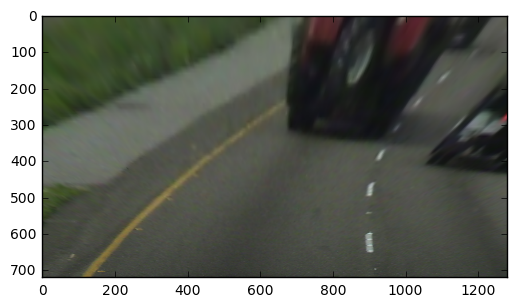

In [21]:
M = cv2.getPerspectiveTransform(np.float32(get_src_pts(img)), np.float32(get_dst_pts(img)))
Minv = cv2.getPerspectiveTransform(np.float32(get_dst_pts(img)), np.float32(get_src_pts(img)))

def warp_perspective(img):
    return cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

def unwarp_perspective(img):
    return cv2.warpPerspective(img, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

warped = warp_perspective(img)
plt.imshow(warped)
plt.show()